In [1]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import ta

from scipy.signal import find_peaks

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

from joblib import dump, load

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import TimeSeriesSplit, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold,cross_val_score
from sklearn.preprocessing import StandardScaler
from ta.volatility import BollingerBands

from xgboost import XGBClassifier, callback as xgb_callback
import optuna
from tqdm import tqdm
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, average_precision_score
from sklearn.metrics import roc_curve, precision_recall_curve, auc
from sklearn.preprocessing import label_binarize

import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.ensemble import BalancedRandomForestClassifier

from optuna.samplers import TPESampler  # стох. оптимизатор «дерево Парзена»
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC

from ta.momentum import StochasticOscillator

# from optuna_integration import TFKerasPruningCallback
# import tensorflow as tf
# from tensorflow.keras.utils import to_categorical
# from tensorflow.keras import layers, models, callbacks
# from tensorflow.keras import Sequential, Input
# from tensorflow.keras.layers import LSTM, Dropout, Dense
# from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.metrics import Precision 

# from tensorflow.keras.regularizers import l2



/opt/miniconda3/envs/crypto/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
btc_df = pd.read_csv('data/btcusdt_1m_2.csv')
btc_df.time = pd.to_datetime(btc_df.time, utc=True)


prices_full = btc_df['close'].values

peaks,   _ = find_peaks(prices_full,  distance=0.5 * 24 * 60, prominence=1000, width=3)
troughs, _ = find_peaks(-prices_full, distance=0.5 * 24 * 60, prominence=1000, width=3)

btc_df['is_peak']   = btc_df.index.to_series().isin(peaks)
btc_df['is_trough'] = btc_df.index.to_series().isin(troughs)
btc_df['is_reverse'] = (btc_df['is_peak'] | btc_df['is_trough'])

# Создаем копии оригинальных колонок, чтобы не потерять
btc_df['is_peak_orig'] = btc_df['is_peak']
btc_df['is_trough_orig'] = btc_df['is_trough']

# Обнуляем, чтобы размечать заново
btc_df['is_peak'] = False
btc_df['is_trough'] = False
btc_df['is_reverse'] = False

# Проходим по оригинальным пикам и впадинам
for idx in btc_df.index[btc_df['is_peak_orig'] | btc_df['is_trough_orig']]:
    start = max(idx - 2, 0)
    end = min(idx + 10, len(btc_df))

    btc_df.loc[start:end, 'is_reverse'] = True

    if btc_df.at[idx, 'is_peak_orig']:
        btc_df.loc[start:end, 'is_peak'] = True  # Наследуем признак пика
    if btc_df.at[idx, 'is_trough_orig']:
        btc_df.loc[start:end, 'is_trough'] = True  # Наследуем признак впадины

btc_df['signal'] = np.where(
    btc_df['is_peak'], 'sell',
    np.where(btc_df['is_trough'], 'buy', 'none')
)

In [3]:
# Создаем индикатор стохастического осциллятора
stoch = StochasticOscillator(
    high=btc_df['high'],      # серия максимальных цен
    low=btc_df['low'],        # серия минимальных цен
    close=btc_df['close'],    # серия цен закрытия
    window=60,                # период %K (стандартно 14)
    smooth_window=13,          # период %D (стандартно 3)
    fillna=False              # не заполнять NaN значения
)


btc_df['stoch_k'] = stoch.stoch()           # %K линия
btc_df['stoch_d'] = stoch.stoch_signal()    # %D линия (сигнальная)

btc_df[f'stoch_k_lag1'] = btc_df['stoch_k'].shift(1)
btc_df[f'stoch_d_lag1'] = btc_df['stoch_d'].shift(1)
btc_df[f'stoch_k_lag2'] = btc_df['stoch_k'].shift(2)
btc_df[f'stoch_d_lag2'] = btc_df['stoch_d'].shift(2)

btc_df['stoch_k_diff1'] = btc_df['stoch_k'] - btc_df['stoch_k_lag1']
btc_df['stoch_d_diff1'] = btc_df['stoch_d'] - btc_df['stoch_d_lag1']
btc_df['stoch_k_diff2'] = btc_df['stoch_k'] - btc_df['stoch_k_lag2']
btc_df['stoch_d_diff2'] = btc_df['stoch_d'] - btc_df['stoch_d_lag2']

In [4]:
btc_df_train_part = 0.8

n_total   = len(btc_df)
n_train   = int(n_total * btc_df_train_part)

# Делаем срезы
btc_df_train = btc_df.iloc[:n_train].copy()
btc_df_test  = btc_df.iloc[n_train:].copy()

In [ ]:

total_needed     = 5000   
min_chunk_size   = 50     
max_chunk_size   = 200    


working_df = btc_df_train.reset_index(names='orig_idx')


mask_non_rev = ~working_df['is_reverse']


working_df['grp'] = mask_non_rev.ne(mask_non_rev.shift()).cumsum()


runs = working_df.loc[mask_non_rev].groupby('grp')
runs_info = runs.size().reset_index(name='length')


valid_runs = runs_info[
    (runs_info['length'] >= min_chunk_size)
].copy().sample(frac=1, random_state=42).reset_index(drop=True)

selected_chunks = []
remaining = total_needed

for _, row in valid_runs.iterrows():
    block = runs.get_group(row['grp'])
    L = row['length']

    
    if L > max_chunk_size:
        block = block.iloc[:max_chunk_size]
        L = max_chunk_size

    
    if L < min_chunk_size:
        continue

    
    take_n = min(L, remaining)
    selected_chunks.append(block.iloc[:take_n])
    remaining -= take_n

    if remaining == 0:
        break

non_reverse_chunks = pd.concat(selected_chunks)


only_true = working_df.loc[working_df['is_reverse']].copy()
train_df = pd.concat([only_true, non_reverse_chunks], ignore_index=True)
train_df = train_df.sort_values('orig_idx').drop(columns=['orig_idx', 'grp'])
train_df.dropna(inplace=True)

In [6]:
mask_col = ['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']

<h2>Random Forest</h2>

In [ ]:
X_train = train_df[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_train = train_df['signal']



mapping = {'none': 0, 'sell': 1, 'buy': 2}
y_train_enc = y_train.map(mapping)


In [ ]:
def objective(trial):
    
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 2, 30),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy']),
    }
    
    
    clf = RandomForestClassifier(**params, random_state=42, n_jobs=-1)
    
    
    tscv = TimeSeriesSplit(n_splits=3)

    precision_macro_scorer = make_scorer(
    precision_score,
    average='macro',
    zero_division=0
)
    
    scores = cross_val_score(
        clf,
        X_train,
        y_train_enc,
        cv=tscv,
        scoring=precision_macro_scorer,
        n_jobs=-1
    )
    
    return scores.mean()


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-05-20 21:14:25,847] A new study created in memory with name: no-name-327df784-7a85-42e1-87bf-1bb454f5247c
[I 2025-05-20 21:14:33,545] Trial 0 finished with value: 0.6934704408815838 and parameters: {'n_estimators': 399, 'max_depth': 27, 'min_samples_split': 3, 'min_samples_leaf': 17, 'max_features': None, 'criterion': 'entropy'}. Best is trial 0 with value: 0.6934704408815838.
[I 2025-05-20 21:14:36,726] Trial 1 finished with value: 0.6925100839975326 and parameters: {'n_estimators': 495, 'max_depth': 24, 'min_samples_split': 6, 'min_samples_leaf': 12, 'max_features': 'log2', 'criterion': 'entropy'}. Best is trial 0 with value: 0.6934704408815838.
[I 2025-05-20 21:14:37,743] Trial 2 finished with value: 0.6782148249686579 and parameters: {'n_estimators': 373, 'max_depth': 2, 'min_samples_split': 17, 'min_samples_leaf': 11, 'max_features': 'log2', 'criterion': 'entropy'}. Best is trial 0 with value: 0.6934704408815838.
[I 2025-05-20 21:14:39,734] Trial 3 finished with value: 0.6

In [ ]:
# clf_best = load('models/bollinger_bands/random_forest/model_btc_best.joblib')
# tempp = btc_df.dropna(subset=['bb_high', 'bb_mid', 'bb_low', 'bb_high_mean_1h', 'bb_mid_mean_1h', 'bb_low_mean_1h'], how='any').copy()


In [8]:
#best_model = RandomForestClassifier(**study.best_params, random_state=42, n_jobs=-1)
best_model = load('models/stoh_osc/random_forest/model_test_btc.joblib')
best_model.fit(X_train, y_train_enc)

X_test = btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_test = btc_df_test['signal']

y_test_enc  = y_test.map(mapping)

y_pred = best_model.predict(X_test)
y_probas = best_model.predict_proba(X_test)
print(classification_report(y_test_enc, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.36      0.53    346966
           1       0.02      0.91      0.04      2717
           2       0.02      0.94      0.04      2769

    accuracy                           0.37    352452
   macro avg       0.35      0.74      0.21    352452
weighted avg       0.98      0.37      0.52    352452



In [ ]:
proba_all = best_model.predict_proba(btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']])
pred = best_model.predict(btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']])
proba_class_0 = proba_all[:, 0]###
proba_class_1 = proba_all[:, 1]###
proba_class_2 = proba_all[:, 2]###

btc_df_test['true_proba1'] = proba_class_1
btc_df_test['true_proba2'] = proba_class_2

btc_df_test['predicted_signal'] = np.where(btc_df_test['true_proba1'] >= 0.85, 'sell',
                                       np.where(btc_df_test['true_proba2'] >= 0.85, 'buy', None))

btc_df_high_conf = btc_df_test[btc_df_test['predicted_signal'].notna()].copy()

btc_df_high_conf.predicted_signal.value_counts()

predicted_signal
sell    22897
buy     16479
Name: count, dtype: int64

['models/stoh_osc/random_forest/model_test_btc.joblib']

In [13]:
def plot_res(df, start_time, end_time):

    temp = df[(df.time > start_time) & (df.time < end_time)].copy()

    fig = make_subplots(
        rows=1, cols=1,            
        shared_xaxes=True,
        vertical_spacing=0.02,
        subplot_titles=('Candlechart',)
    )

    fig.add_trace(
        go.Candlestick(
            x=temp['time'], open=temp['open'], high=temp['high'],
            low=temp['low'], close=temp['close'],
            increasing_line_color='green',
            decreasing_line_color='red'
        ),
        row=1, col=1
    )

    
    # Добавляем сигналы покупки (зеленые стрелки снизу вверх)
    buy_signals = temp[temp['predicted_signal_clean'] == 'buy']
    if not buy_signals.empty:
        fig.add_trace(
            go.Scatter(
                x=buy_signals['time'],
                y=buy_signals['low'] * 0.97,  # Немного ниже свечи
                mode='markers',
                marker=dict(
                    symbol='triangle-up',
                    size=15,
                    color='green',
                    line=dict(width=2, color='darkgreen')
                ),
                name='Buy Signal',
                customdata=buy_signals['true_proba2'],
                hovertemplate=(
                    'PredictProbe1: %{customdata}<br>'
                    'Time: %{x}<br>'
                    'Price: %{y}<extra></extra>'
                )
            ), row=1, col=1
        )
    
    # Добавляем сигналы продажи (красные стрелки сверху вниз)
    sell_signals = temp[temp['predicted_signal_clean'] == 'sell']
    if not sell_signals.empty:
        fig.add_trace(
            go.Scatter(
                x=sell_signals['time'],
                y=sell_signals['high'] * 1.03,  # Немного выше свечи
                mode='markers',
                marker=dict(
                    symbol='triangle-down',
                    size=15,
                    color='red',
                    line=dict(width=2, color='darkred')
                ),
                name='Sell Signal',
                customdata=sell_signals['true_proba1'],
                hovertemplate=(
                    'PredictProbe1: %{customdata}<br>'
                    'Time: %{x}<br>'
                    'Price: %{y}<extra></extra>'
                )
            ), row=1, col=1
        )


    fig.update_layout(
        title='Predicted singals',
        width=1200, height=800, hovermode='x unified',
        xaxis_rangeslider_visible=False
    )
    fig.update_xaxes(type='date', row=1, col=1)
    #fig.update_xaxes(type='date', row=2, col=1)

    fig.show()
    

In [16]:
threshold = pd.Timedelta(hours=3)

# Делаем копию столбца, чтобы оригинал остался нетронутым
btc_df_test['predicted_signal_clean'] = btc_df_test['predicted_signal']

# Для каждого типа сигнала «BUY» и «SELL» оставляем только первый в кластере
for sig in ['buy', 'sell']:
    # маска строк с этим сигналом
    mask = btc_df_test['predicted_signal_clean'] == sig
    # время этих строк
    times = btc_df_test.loc[mask, 'time']
    # разница по времени между соседними строками с этим же сигналом
    dt = times.diff()
    # все, у кого dt <= threshold (то есть не первый в кластере), обнуляем
    drop_idx = dt[dt <= threshold].index
    btc_df_test.loc[drop_idx, 'predicted_signal_clean'] = None


plot_res(btc_df_test, '2024-10-01 00:00:00', '2024-11-01 00:00:00')

In [34]:
y_test_enc.value_counts()

signal
0    342746
2      4899
1      4807
Name: count, dtype: int64

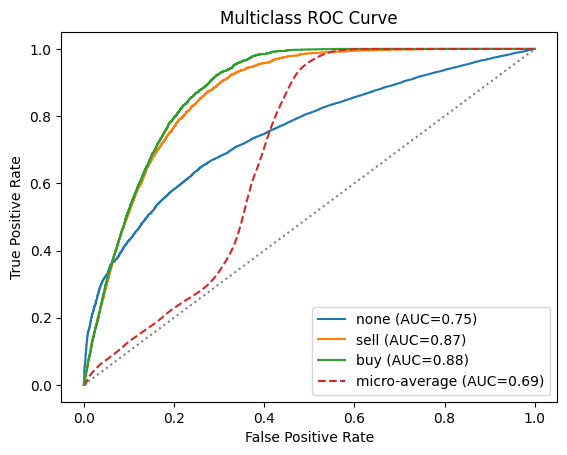

In [17]:
inv_mapping = {v: k for k, v in mapping.items()}

# Бинаризация меток
y_test_bin = label_binarize(y_test_enc, classes=[0, 1, 2])
n_classes = y_test_bin.shape[1]

# ROC AUC
fpr = {}
tpr = {}
roc_auc = {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probas[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_probas.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# График ROC-кривых
plt.figure()
for i in range(n_classes):
    class_name = inv_mapping[i]
    plt.plot(fpr[i], tpr[i], label=f"{class_name} (AUC={roc_auc[i]:.2f})")
plt.plot(fpr["micro"], tpr["micro"], label=f"micro-average (AUC={roc_auc['micro']:.2f})", linestyle="--")
plt.plot([0, 1], [0, 1], linestyle=":", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve")
plt.legend()
plt.show()


In [38]:
from sklearn.metrics import balanced_accuracy_score
bal_acc = balanced_accuracy_score(y_test_enc, y_pred)
bal_acc

0.6597825777097694

In [40]:
from sklearn.metrics import f1_score
f1_macro = f1_score(y_test_enc, y_pred, average="macro")
f1_macro

0.13889341730572533

In [46]:
from sklearn.metrics import roc_auc_score
roc_auc_macro = roc_auc_score(y_test_enc, y_probas, multi_class="ovo", average="macro")
roc_auc_macro

0.8316300310350805

In [44]:
from sklearn.metrics import average_precision_score
ap_macro = average_precision_score(y_test_enc, y_probas, average="macro")
ap_macro

0.3648650328863297

In [45]:
from sklearn.metrics import matthews_corrcoef
mcc = matthews_corrcoef(y_test_enc, y_pred)
mcc

0.09008095392353024

<h2>XGBoost</h2>

In [ ]:
X_train = train_df[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_train = train_df['signal']

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

mapping = {'none': 0, 'sell': 1, 'buy': 2}
y_train_enc = y_train.map(mapping)


In [264]:
def objective(trial):
    params = {
        'n_estimators':        trial.suggest_int('n_estimators', 50, 500),
        'max_depth':           trial.suggest_int('max_depth', 3, 15),
        'learning_rate':       trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
        'subsample':           trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree':    trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma':               trial.suggest_float('gamma', 0.0, 5.0),
        'reg_alpha':           trial.suggest_float('reg_alpha', 1e-8, 1.0, log=True),
        'reg_lambda':          trial.suggest_float('reg_lambda', 1e-8, 1.0, log=True),
        'eval_metric':         'mlogloss',   # оставляем
        'verbosity':           0             # чтобы тише работало
    }
    clf = XGBClassifier(**params, n_jobs=-1)
    tscv = TimeSeriesSplit(n_splits=3)
    scores = cross_val_score(
        clf,
        X_train,
        y_train_enc,
        cv=tscv,
        scoring='precision_macro',
        n_jobs=-1
    )
    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-05-20 21:19:48,357] A new study created in memory with name: no-name-867789fe-12e5-4915-91e1-5d58b494c1d6
[I 2025-05-20 21:19:48,737] Trial 0 finished with value: 0.6915784976769977 and parameters: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.0014606553617923343, 'subsample': 0.5971004730273948, 'colsample_bytree': 0.8747301538561891, 'gamma': 3.062995487823077, 'reg_alpha': 1.9955488401525725e-07, 'reg_lambda': 1.026385185373027e-08}. Best is trial 0 with value: 0.6915784976769977.
[I 2025-05-20 21:19:49,736] Trial 1 finished with value: 0.6972544065776128 and parameters: {'n_estimators': 459, 'max_depth': 10, 'learning_rate': 0.006669804270504127, 'subsample': 0.92015369976841, 'colsample_bytree': 0.6834886128877544, 'gamma': 3.9589139790336105, 'reg_alpha': 6.362849844448254e-05, 'reg_lambda': 2.0791605642850466e-07}. Best is trial 1 with value: 0.6972544065776128.
[I 2025-05-20 21:19:50,337] Trial 2 finished with value: 0.6931992812862658 and parameters: {'n_est

In [35]:
#print("Лучшие гиперпараметры:", study.best_params)

# финальная модель
# best_params = study.best_params.copy()
# clf_best = XGBClassifier(**best_params, random_state=42, n_jobs=-1)
# clf_best.fit(X_train, y_train_enc)

clf_best = load('models/stoh_osc/xgboost/btc_xgb_test.joblib')

X_test = btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_test = btc_df_test['signal']

y_test_enc  = y_test.map(mapping)

y_pred = clf_best.predict(X_test)
y_probas = clf_best.predict_proba(X_test)

print(classification_report(y_test_enc, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.36      0.53    346966
           1       0.02      0.90      0.04      2717
           2       0.02      0.94      0.04      2769

    accuracy                           0.37    352452
   macro avg       0.35      0.74      0.21    352452
weighted avg       0.98      0.37      0.53    352452



['models/stoh_osc/xgboost/btc_xgb_test.joblib']

In [270]:
X_test = btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
proba_all   = clf_best.predict_proba(X_test)
btc_df_test['true_proba0'] = proba_all[:, 0]
btc_df_test['true_proba1'] = proba_all[:, 1]
btc_df_test['true_proba2']  = proba_all[:, 2]

# 2) Задаём порог уверенности
threshold = 0.8

# 3) Векторизованно присваиваем сигналы
#    Сначала помечаем «buy» там, где P(buy) >= threshold
btc_df_test['predicted_signal'] = None
btc_df_test.loc[btc_df_test['true_proba2']  >= threshold, 'predicted_signal'] = 'buy'
#    Затем «sell» там, где ещё не куплены и P(sell) >= threshold
mask_sell = btc_df_test['predicted_signal'].isna() & (btc_df_test['true_proba1'] >= threshold)
btc_df_test.loc[mask_sell, 'predicted_signal'] = 'sell'

# 4) Оставляем только высоко-доверительные предсказания
btc_df_high_conf = btc_df_test[btc_df_test['predicted_signal'].notna()].copy()

# 5) Смотрим распределение
print(btc_df_high_conf['predicted_signal'].value_counts())

predicted_signal
buy     36511
sell    28586
Name: count, dtype: int64


In [41]:
threshold = pd.Timedelta(hours=3)

# Делаем копию столбца, чтобы оригинал остался нетронутым
btc_df_test['predicted_signal_clean'] = btc_df_test['predicted_signal']

# Для каждого типа сигнала «BUY» и «SELL» оставляем только первый в кластере
for sig in ['buy', 'sell']:
    # маска строк с этим сигналом
    mask = btc_df_test['predicted_signal_clean'] == sig
    # время этих строк
    times = btc_df_test.loc[mask, 'time']
    # разница по времени между соседними строками с этим же сигналом
    dt = times.diff()
    # все, у кого dt <= threshold (то есть не первый в кластере), обнуляем
    drop_idx = dt[dt <= threshold].index
    btc_df_test.loc[drop_idx, 'predicted_signal_clean'] = None


plot_res(btc_df_test, '2024-10-01 00:00:00', '2024-11-01 00:00:00')

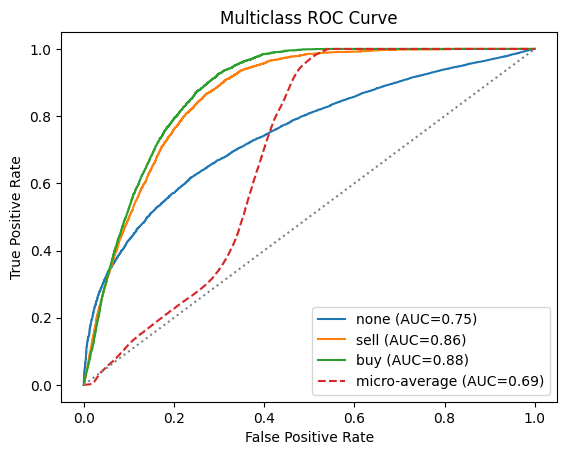

In [42]:
inv_mapping = {v: k for k, v in mapping.items()}

# Бинаризация меток
y_test_bin = label_binarize(y_test_enc, classes=[0, 1, 2])
n_classes = y_test_bin.shape[1]

# ROC AUC
fpr = {}
tpr = {}
roc_auc = {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probas[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_probas.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# График ROC-кривых
plt.figure()
for i in range(n_classes):
    class_name = inv_mapping[i]
    plt.plot(fpr[i], tpr[i], label=f"{class_name} (AUC={roc_auc[i]:.2f})")
plt.plot(fpr["micro"], tpr["micro"], label=f"micro-average (AUC={roc_auc['micro']:.2f})", linestyle="--")
plt.plot([0, 1], [0, 1], linestyle=":", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve")
plt.legend()
plt.show()


In [43]:
from sklearn.metrics import balanced_accuracy_score
bal_acc = balanced_accuracy_score(y_test_enc, y_pred)
bal_acc

0.7368467563184198

In [44]:
from sklearn.metrics import f1_score
f1_macro = f1_score(y_test_enc, y_pred, average="macro")
f1_macro

0.20697182431366815

In [45]:
from sklearn.metrics import roc_auc_score
roc_auc_macro = roc_auc_score(y_test_enc, y_probas, multi_class="ovo", average="macro")
roc_auc_macro

0.8724543392811599

In [46]:
from sklearn.metrics import average_precision_score
ap_macro = average_precision_score(y_test_enc, y_probas, average="macro")
ap_macro

0.3570699043102106

In [277]:
from sklearn.metrics import matthews_corrcoef
mcc = matthews_corrcoef(y_test_enc, y_pred)
mcc

0.09723665079654026

<h2>SVC</h2>

In [ ]:
X_train = train_df[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_train = train_df['signal']



mapping = {'none': 0, 'sell': 1, 'buy': 2}
y_train_enc = y_train.map(mapping)
y_test_enc  = y_test.map(mapping)

In [ ]:
def objective(trial):
    C     = trial.suggest_float('C', 1e-2, 100, log=True)
    gamma = trial.suggest_float('gamma', 1e-3, 1, log=True)

    model = Pipeline([
        ('scale', StandardScaler()),
        ('svc',   SVC(C=C, gamma=gamma, kernel='rbf',
                      class_weight='balanced', random_state=42))
    ])

    cv = TimeSeriesSplit(n_splits=5)
    score = cross_val_score(model, X_train, y_train,
                            cv=cv,
                            scoring='precision_macro',
                            n_jobs=-1).mean()
    return score


sampler = TPESampler(seed=42)
study   = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=100, timeout=600)

print('Лучший trial:', study.best_trial.number)
print('Лучший precision_macro  :', study.best_trial.value)
print('Параметры  :', study.best_params)

[I 2025-05-20 21:27:06,068] A new study created in memory with name: no-name-35a91e5b-a154-4165-903e-430973aaf1ac
[I 2025-05-20 21:27:09,448] Trial 0 finished with value: 0.6955079096434973 and parameters: {'C': 0.31489116479568624, 'gamma': 0.711447600934342}. Best is trial 0 with value: 0.6955079096434973.
[I 2025-05-20 21:27:11,471] Trial 1 finished with value: 0.7190693666561294 and parameters: {'C': 8.471801418819979, 'gamma': 0.06251373574521749}. Best is trial 1 with value: 0.7190693666561294.
[I 2025-05-20 21:27:13,981] Trial 2 finished with value: 0.6645023911999529 and parameters: {'C': 0.04207988669606638, 'gamma': 0.0029375384576328283}. Best is trial 1 with value: 0.7190693666561294.
[I 2025-05-20 21:27:16,109] Trial 3 finished with value: 0.6736527480094174 and parameters: {'C': 0.017073967431528128, 'gamma': 0.39676050770529875}. Best is trial 1 with value: 0.7190693666561294.
[I 2025-05-20 21:27:17,694] Trial 4 finished with value: 0.7145688783830922 and parameters: {'C

Лучший trial: 13
Лучший precision_macro  : 0.723696370665418
Параметры  : {'C': 89.49356782718716, 'gamma': 0.010515536484887244}


In [ ]:












svc_pipe = load('models/stoh_osc/svc/btc_svc_scaled_test.pkl')

X_test  = btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_test  = btc_df_test['signal']
y_test_enc = y_test.map(mapping)

y_pred = svc_pipe.predict(X_test)
print(classification_report(y_test_enc, y_pred, target_names=['none','sell','buy']))

              precision    recall  f1-score   support

        none       1.00      0.31      0.47    346966
        sell       0.02      0.94      0.04      2717
         buy       0.02      0.96      0.04      2769

    accuracy                           0.32    352452
   macro avg       0.35      0.74      0.19    352452
weighted avg       0.98      0.32      0.47    352452



['models/stoh_osc/svc/btc_svc_scaled_test.pkl']

In [10]:
svc_pipe = load('models/stoh_osc/svc/btc_svc_scaled_test.pkl')

X_test  = btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']]
y_test  = btc_df_test['signal']
y_test_enc = y_test.map(mapping)

y_pred = svc_pipe.predict(X_test)
y_probas = svc_pipe.predict_proba(X_test)

print(classification_report(y_test_enc, y_pred, target_names=['none','sell','buy']))

              precision    recall  f1-score   support

        none       1.00      0.31      0.47    346966
        sell       0.02      0.94      0.04      2717
         buy       0.02      0.96      0.04      2769

    accuracy                           0.32    352452
   macro avg       0.35      0.74      0.19    352452
weighted avg       0.98      0.32      0.47    352452



['models/stoh_osc/svc/btc_svc_scaled.pkl']

In [ ]:
proba_all = svc_pipe.predict_proba(btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']])
pred = svc_pipe.predict(btc_df_test[['stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2', 'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2', 'stoch_d_diff2']])
proba_class_0 = proba_all[:, 0]###
proba_class_1 = proba_all[:, 1]###
proba_class_2 = proba_all[:, 2]###

btc_df_test['true_proba1'] = proba_class_1
btc_df_test['true_proba2'] = proba_class_2

btc_df_test['predicted_signal'] = np.where(btc_df_test['true_proba1'] >= 0.8, 'sell',
                                       np.where(btc_df_test['true_proba2'] >= 0.8, 'buy', None))

btc_df_high_conf = btc_df_test[btc_df_test['predicted_signal'].notna()].copy()

btc_df_high_conf.predicted_signal.value_counts()

predicted_signal
sell    17279
buy     13107
Name: count, dtype: int64

In [64]:
btc_df_high_conf

,time,open,high,low,close,volume,is_peak,is_trough,is_reverse,is_peak_orig,...,stoch_d_diff1,stoch_k_diff2,stoch_d_diff2,true_proba1,true_proba2,predicted_signal,predicted_signal_clean,proba_none,proba_sell,proba_buy
1409806,2024-09-06 02:06:00+00:00,56551.99,56654.00,56538.00,56651.09,43.35658,False,False,False,False,...,1.566285,11.363964,2.184027,0.017108,0.805523,buy,buy,0.292969,0.452390,0.254641
1409807,2024-09-06 02:07:00+00:00,56651.09,56688.00,56649.00,56672.99,22.42342,False,False,False,False,...,0.643149,8.041255,2.209434,0.021985,0.813840,buy,None,0.292176,0.453427,0.254397
1409808,2024-09-06 02:08:00+00:00,56673.00,56690.21,56631.10,56650.64,25.39325,False,False,False,False,...,0.422011,-5.235236,1.065160,0.024605,0.812724,buy,None,0.293086,0.452338,0.254576
1409809,2024-09-06 02:09:00+00:00,56650.65,56837.00,56650.64,56810.01,87.22437,False,False,False,False,...,0.255998,-1.045751,0.678009,0.020066,0.811690,buy,None,0.291903,0.453718,0.254379
1409811,2024-09-06 02:11:00+00:00,56771.00,56858.88,56759.00,56844.00,24.85612,False,False,False,False,...,0.572207,1.410270,0.826518,0.019965,0.817376,buy,None,0.291595,0.453913,0.254491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1762199,2025-05-08 19:19:00+00:00,101032.69,101085.77,101005.03,101085.76,8.79977,False,False,False,False,...,-0.004996,15.627033,-1.948231,0.808036,0.012092,sell,None,0.282578,0.254188,0.463234
1762203,2025-05-08 19:23:00+00:00,101168.00,101187.94,101061.60,101087.23,23.80715,False,False,False,False,...,0.795996,-37.511715,3.006935,0.803883,0.021701,sell,None,0.317057,0.258254,0.424689
1762242,2025-05-08 20:02:00+00:00,101424.19,101500.00,101400.00,101500.00,36.50726,False,False,False,False,...,1.112390,0.000000,3.240901,0.009725,0.801345,buy,None,0.297440,0.445619,0.256941
1762243,2025-05-08 20:03:00+00:00,101499.99,101539.69,101493.12,101529.07,28.35778,False,False,False,False,...,2.399989,-0.911433,3.512379,0.013731,0.810444,buy,None,0.297450,0.445633,0.256917


In [15]:
threshold = pd.Timedelta(hours=3)

# # Делаем копию столбца, чтобы оригинал остался нетронутым
btc_df_test['predicted_signal_clean'] = btc_df_test['predicted_signal']

# Для каждого типа сигнала «BUY» и «SELL» оставляем только первый в кластере
for sig in ['buy', 'sell']:
    # маска строк с этим сигналом
    mask = btc_df_test['predicted_signal_clean'] == sig
    # время этих строк
    times = btc_df_test.loc[mask, 'time']
    # разница по времени между соседними строками с этим же сигналом
    dt = times.diff()
    # все, у кого dt <= threshold (то есть не первый в кластере), обнуляем
    drop_idx = dt[dt <= threshold].index
    btc_df_test.loc[drop_idx, 'predicted_signal_clean'] = None


plot_res(btc_df_test, '2024-09-01 00:00:00', '2024-10-01 00:00:00')

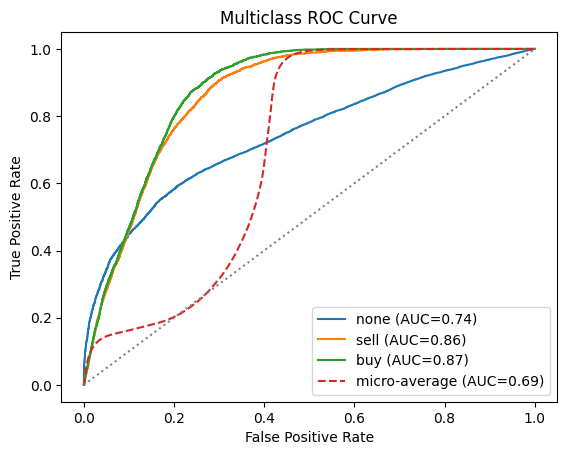

In [16]:
inv_mapping = {v: k for k, v in mapping.items()}

# Бинаризация меток
y_test_bin = label_binarize(y_test_enc, classes=[0, 1, 2])
n_classes = y_test_bin.shape[1]

# ROC AUC
fpr = {}
tpr = {}
roc_auc = {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probas[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_probas.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# График ROC-кривых
plt.figure()
for i in range(n_classes):
    class_name = inv_mapping[i]
    plt.plot(fpr[i], tpr[i], label=f"{class_name} (AUC={roc_auc[i]:.2f})")
plt.plot(fpr["micro"], tpr["micro"], label=f"micro-average (AUC={roc_auc['micro']:.2f})", linestyle="--")
plt.plot([0, 1], [0, 1], linestyle=":", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve")
plt.legend()
plt.show()


In [17]:
from sklearn.metrics import balanced_accuracy_score
bal_acc = balanced_accuracy_score(y_test_enc, y_pred)
bal_acc

0.7352832480935666

In [18]:
from sklearn.metrics import f1_score
f1_macro = f1_score(y_test_enc, y_pred, average="macro")
f1_macro

0.18524334766410136

In [20]:
from sklearn.metrics import roc_auc_score
roc_auc_macro = roc_auc_score(y_test_enc, y_probas, multi_class="ovo", average="macro")
roc_auc_macro

0.8688207386672683

In [19]:
from sklearn.metrics import average_precision_score
ap_macro = average_precision_score(y_test_enc, y_probas, average="macro")
ap_macro

0.3557035741279278

In [63]:
from sklearn.metrics import matthews_corrcoef
mcc = matthews_corrcoef(y_test_enc, y_pred)
mcc

0.10920672248898627

<h2>Тесты</h2>

In [9]:
btc_df_test.columns

Index(['time', 'open', 'high', 'low', 'close', 'volume', 'is_peak',
       'is_trough', 'is_reverse', 'is_peak_orig', 'is_trough_orig', 'signal',
       'stoch_k', 'stoch_d', 'stoch_k_lag1', 'stoch_d_lag1', 'stoch_k_lag2',
       'stoch_d_lag2', 'stoch_k_diff1', 'stoch_d_diff1', 'stoch_k_diff2',
       'stoch_d_diff2'],
      dtype='object')

In [21]:
class Backtest:
    def __init__(self, model, test_market_data, start_balance):#, base_trade_unit):
        self.model = model
        self.test_market_data = test_market_data.copy()
        self.trades = pd.DataFrame({
            'open_time': pd.Series([], dtype='datetime64[ns, UTC]'),
            'open_price': pd.Series([], dtype='float'),
            'close_price': pd.Series([], dtype='float'),
            'close_time': pd.Series([], dtype='datetime64[ns, UTC]'),
            'side': pd.Series([], dtype='str'),
        })
        self.balance = start_balance
        self.balance_history = pd.DataFrame({
                'trade_id': pd.Series([], dtype='int'),
                'time': pd.Series([], dtype='datetime64[ns, Etc/GMT+5]'),
                'balance': pd.Series([], dtype='float'),
                'affect': pd.Series([], dtype='str'),
                'coef': pd.Series([], dtype='float')
                })
        #self.base_trade_unit = base_trade_unit

    def predict(self, min_probability):

        # proba_all   = self.model.predict_proba(X_test)
        # self.test_market_data['true_proba0'] = proba_all[:, 0]
        # self.test_market_data['true_proba1'] = proba_all[:, 1]
        # self.test_market_data['true_proba2']  = proba_all[:, 2]


        # # 3) Векторизованно присваиваем сигналы
        # #    Сначала помечаем «buy» там, где P(buy) >= threshold
        # self.test_market_data['predicted_signal'] = None
        # self.test_market_data.loc[self.test_market_data['true_proba2']  >= min_probability, 'predicted_signal'] = 'buy'
        # #    Затем «sell» там, где ещё не куплены и P(sell) >= threshold
        # mask_sell = self.test_market_data['predicted_signal'].isna() & (self.test_market_data['true_proba1'] >= min_probability)
        # self.test_market_data.loc[mask_sell, 'predicted_signal'] = 'sell'

        proba_all = self.model.predict_proba(self.test_market_data[mask_col])
        proba_class_0 = proba_all[:, 0]
        proba_class_1 = proba_all[:, 1]###
        proba_class_2 = proba_all[:, 2]###

        self.test_market_data['true_proba0'] = proba_class_0
        self.test_market_data['true_proba1'] = proba_class_1
        self.test_market_data['true_proba2'] = proba_class_2

        self.test_market_data['predicted_signal'] = np.where(self.test_market_data['true_proba1'] >= min_probability, 'sell',
                                            np.where(self.test_market_data['true_proba2'] >= min_probability, 'buy', None))


        threshold = pd.Timedelta(hours=2)

        # Делаем копию столбца, чтобы оригинал остался нетронутым
        self.test_market_data['predicted_signal_clean'] = self.test_market_data['predicted_signal']
        # Для каждого типа сигнала «BUY» и «SELL» оставляем только первый в кластере
        for sig in ['buy', 'sell']:
            # маска строк с этим сигналом
            mask = self.test_market_data['predicted_signal_clean'] == sig
            # время этих строк
            times = self.test_market_data.loc[mask, 'time']
            # разница по времени между соседними строками с этим же сигналом
            dt = times.diff()
            # все, у кого dt <= threshold (то есть не первый в кластере), обнуляем
            drop_idx = dt[dt <= threshold].index
            self.test_market_data.loc[drop_idx, 'predicted_signal_clean'] = None
        
        
    
    def calculate_trades(self, target_close):
        self.trades = self.trades.iloc[0:0]

        mask_predicted_signal = self.test_market_data.predicted_signal_clean.isin(['sell', 'buy'])
        for index, row in tqdm(self.test_market_data[mask_predicted_signal].iterrows(), total=self.test_market_data[mask_predicted_signal].shape[0]):
            open_time = row.time
            open_price = row.open

            # 1. граница в час вперёд
            end_time = open_time + pd.Timedelta(hours=2)

            # 2. «окно» следующих свечей
            future = self.test_market_data[
                (self.test_market_data.time > open_time) &
                (self.test_market_data.time <= end_time)
            ]

            if row.predicted_signal_clean == 'buy':
                # 3. целевая цена +2 %
                target = open_price * (1 + target_close/100)
                hit = future[future.high >= target]
            else:
                target = open_price * (1 - target_close/100)
                hit = future[future.low <= target]

            # 4. ищем первую свечу, где high ≥ target
            #hit = future[future.high >= target]

            if not hit.empty:
                # 5a. если порог достигнут — считаем, что мы фиксируем по target
                close_price = target
                close_time = hit.iloc[0].time
            else:
                # 5b. иначе — берём цену закрытия последней свечи в окне
                if not future.empty:
                    close_price = future.iloc[-1].close
                    close_time = future.iloc[-1].time
                else:
                    # на тот случай, если данных после сигнала нет
                    close_price = open_price
                    close_time = open_time

            new_row = {
                'open_time': open_time,
                'open_price': open_price,
                'close_time': close_time,
                'close_price': close_price,
                'side': row.predicted_signal_clean
            }
            self.trades = pd.concat(
                [self.trades, pd.DataFrame([new_row], columns=self.trades.columns)],
                ignore_index=True
            )

    def plot(self, min_datetime, max_datetime):
                plot_res(self.test_market_data, min_datetime, max_datetime)

In [ ]:
model1 = load('models/stoh_osc/random_forest/model_test_btc.joblib')
test = Backtest(model1, btc_df_test, 1000)

In [194]:
test.predict(min_probability=0.67)

,time,open,high,low,close,volume,is_peak,is_trough,is_reverse,is_peak_orig,...,stoch_k_diff2,stoch_d_diff2,proba_none,proba_sell,proba_buy,predicted_signal,predicted_signal_clean,true_proba0,true_proba1,true_proba2
1409806,2024-09-06 02:06:00+00:00,56551.99,56654.00,56538.00,56651.09,43.35658,False,False,False,False,...,11.363964,2.184027,0.196650,0.672035,0.131314,sell,sell,0.196650,0.672035,0.131314
1409807,2024-09-06 02:07:00+00:00,56651.09,56688.00,56649.00,56672.99,22.42342,False,False,False,False,...,8.041255,2.209434,0.178818,0.692391,0.128792,sell,sell,0.178818,0.692391,0.128792
1409808,2024-09-06 02:08:00+00:00,56673.00,56690.21,56631.10,56650.64,25.39325,False,False,False,False,...,-5.235236,1.065160,0.170404,0.702327,0.127269,sell,sell,0.170404,0.702327,0.127269
1409809,2024-09-06 02:09:00+00:00,56650.65,56837.00,56650.64,56810.01,87.22437,False,False,False,False,...,-1.045751,0.678009,0.171592,0.701321,0.127087,sell,sell,0.171592,0.701321,0.127087
1409810,2024-09-06 02:10:00+00:00,56810.00,56811.56,56757.00,56771.00,15.89009,False,False,False,False,...,-2.343963,0.510309,0.173440,0.699712,0.126848,sell,sell,0.173440,0.699712,0.126848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1762253,2025-05-08 20:13:00+00:00,101516.23,101516.23,101489.73,101489.74,4.88929,False,False,False,False,...,-2.110233,-4.628972,0.361877,0.426333,0.211790,None,None,0.361877,0.426333,0.211790
1762254,2025-05-08 20:14:00+00:00,101489.73,101489.74,101434.37,101434.38,9.93008,False,False,False,False,...,-9.494310,-6.564335,0.368764,0.371179,0.260057,None,None,0.368764,0.371179,0.260057
1762255,2025-05-08 20:15:00+00:00,101434.38,101434.39,101290.42,101353.30,22.99153,False,False,False,False,...,-15.828490,-7.781911,0.368806,0.288954,0.342240,None,None,0.368806,0.288954,0.342240
1762256,2025-05-08 20:16:00+00:00,101353.29,101353.30,101320.87,101333.34,10.43344,False,False,False,False,...,-11.721714,-8.613471,0.370701,0.280521,0.348778,None,None,0.370701,0.280521,0.348778


,open_time,open_price,close_price,close_time,side


In [195]:
test.test_market_data[~test.test_market_data.predicted_signal.isna()]


,time,open,high,low,close,volume,is_peak,is_trough,is_reverse,is_peak_orig,...,stoch_k_diff2,stoch_d_diff2,proba_none,proba_sell,proba_buy,predicted_signal,predicted_signal_clean,true_proba0,true_proba1,true_proba2
1409806,2024-09-06 02:06:00+00:00,56551.99,56654.00,56538.00,56651.09,43.35658,False,False,False,False,...,11.363964,2.184027,0.196650,0.672035,0.131314,sell,sell,0.196650,0.672035,0.131314
1409807,2024-09-06 02:07:00+00:00,56651.09,56688.00,56649.00,56672.99,22.42342,False,False,False,False,...,8.041255,2.209434,0.178818,0.692391,0.128792,sell,None,0.178818,0.692391,0.128792
1409808,2024-09-06 02:08:00+00:00,56673.00,56690.21,56631.10,56650.64,25.39325,False,False,False,False,...,-5.235236,1.065160,0.170404,0.702327,0.127269,sell,None,0.170404,0.702327,0.127269
1409809,2024-09-06 02:09:00+00:00,56650.65,56837.00,56650.64,56810.01,87.22437,False,False,False,False,...,-1.045751,0.678009,0.171592,0.701321,0.127087,sell,None,0.171592,0.701321,0.127087
1409810,2024-09-06 02:10:00+00:00,56810.00,56811.56,56757.00,56771.00,15.89009,False,False,False,False,...,-2.343963,0.510309,0.173440,0.699712,0.126848,sell,None,0.173440,0.699712,0.126848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1762196,2025-05-08 19:16:00+00:00,101066.00,101092.73,101063.49,101063.50,5.83006,False,False,False,False,...,2.552700,-7.880600,0.191369,0.128893,0.679739,buy,None,0.191369,0.128893,0.679739
1762197,2025-05-08 19:17:00+00:00,101063.50,101063.50,101010.40,101016.03,13.77376,False,False,False,False,...,-5.169649,-7.770985,0.192052,0.128653,0.679295,buy,None,0.192052,0.128653,0.679295
1762198,2025-05-08 19:18:00+00:00,101016.02,101040.00,101006.97,101032.70,8.95460,False,False,False,False,...,-0.416683,-5.674502,0.191335,0.128767,0.679898,buy,None,0.191335,0.128767,0.679898
1762199,2025-05-08 19:19:00+00:00,101032.69,101085.77,101005.03,101085.76,8.79977,False,False,False,False,...,15.627033,-1.948231,0.195672,0.131741,0.672587,buy,None,0.195672,0.131741,0.672587


In [190]:
test.calculate_trades(target_close=2)
trades = test.trades.copy()
trades = trades.rename(columns={
    'side':        'side',
    'open_time':   'time_open',
    'open_price':  'price_open',
    'close_time':  'time_close',
    'close_price': 'price_close'
})
trades['symbol']           = 'BTC'
trades['order_weight']     = 1
trades['is_maker_open']    = False
trades['is_maker_close']   = True
trades['amount']           = 0.0005
trades['volume_usd']       = trades['amount'] * trades['price_open']
trades['pl_pct']           = (trades.price_close - trades.price_open) / trades.price_open
trades['pl_usd'] = trades['pl_pct'] * trades['volume_usd'] * np.where(
    trades['side'].str.lower() == 'buy', 
    1, 
    -1
)

100%|██████████| 1062/1062 [00:01<00:00, 844.72it/s]


In [175]:
trades

,time_open,price_open,price_close,time_close,side,symbol,order_weight,is_maker_open,is_maker_close,amount,volume_usd,pl_pct,pl_usd
0,2024-09-06 02:06:00+00:00,56551.99,56697.01,2024-09-06 04:06:00+00:00,sell,BTC,1,False,True,0.0005,28.275995,0.002564,-0.072510
1,2024-09-06 03:53:00+00:00,56544.99,56517.00,2024-09-06 05:53:00+00:00,buy,BTC,1,False,True,0.0005,28.272495,-0.000495,-0.013995
2,2024-09-06 08:32:00+00:00,55887.99,56182.00,2024-09-06 10:32:00+00:00,sell,BTC,1,False,True,0.0005,27.943995,0.005261,-0.147005
3,2024-09-06 11:31:00+00:00,55977.00,56780.00,2024-09-06 13:31:00+00:00,buy,BTC,1,False,True,0.0005,27.988500,0.014345,0.401500
4,2024-09-06 17:13:00+00:00,54191.00,53714.62,2024-09-06 19:13:00+00:00,sell,BTC,1,False,True,0.0005,27.095500,-0.008791,0.238190
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1057,2025-05-07 23:41:00+00:00,97089.99,97884.69,2025-05-08 01:41:00+00:00,buy,BTC,1,False,True,0.0005,48.544995,0.008185,0.397350
1058,2025-05-08 05:14:00+00:00,98956.00,99133.44,2025-05-08 07:14:00+00:00,buy,BTC,1,False,True,0.0005,49.478000,0.001793,0.088720
1059,2025-05-08 11:14:00+00:00,99622.83,99260.83,2025-05-08 13:14:00+00:00,buy,BTC,1,False,True,0.0005,49.811415,-0.003634,-0.181000
1060,2025-05-08 14:32:00+00:00,99603.96,100749.25,2025-05-08 16:32:00+00:00,sell,BTC,1,False,True,0.0005,49.801980,0.011498,-0.572645


In [22]:
class PortfolioAnalysis:
    required_columns = [
        'symbol', 'side', 'time_open', 'price_open', 
        'time_close', 'price_close', 'order_weight', 
        'is_maker_open', 'is_maker_close','volume_usd','amount','pl_usd'
    ]
    
    def __init__(self, df):
        self.validate_data(df)
        self.df = df.copy()
        self.df['time_open'] = pd.to_datetime(self.df['time_open'])
        if 'time_close' in self.df.columns:
            self.df['time_close'] = pd.to_datetime(self.df['time_close'])
    
    def validate_data(self, df):
        missing_columns = [col for col in self.required_columns if col not in df.columns]
        if missing_columns:
            raise ValueError(f"Input DataFrame is missing the following required columns: {', '.join(missing_columns)}")
    
    def resample_data(self, period):
        df_copy = self.df.copy()
        df_copy.set_index('time_open', inplace=True)
        result = df_copy.resample(period).agg({'pl_usd': 'sum'}).reset_index()
        return result

    def days_convert(self):
        return self.resample_data('D')

    def months_convert(self):
        return self.resample_data('M')

    def years_convert(self):
        return self.resample_data('Y')

    def profit_sum(self):
        return round(self.df['pl_usd'].sum(), 3)

    def max_drawdown(self, df=None):
        if df is None:
            df = self.df.copy()
        df['cumulative_sum_pl'] = df['pl_usd'].cumsum()
        df['drawdown'] = df['cumulative_sum_pl'] - df['cumulative_sum_pl'].cummax()
        max_drawdown_value = df['drawdown'].min()
        return round(max_drawdown_value, 3)

    def max_daily_drawdown(self):
        daily_data = self.days_convert()
        return self.max_drawdown(daily_data)

    def win_rate_deals(self):
        win_rate = 100 * len(self.df[self.df['pl_usd'] > 0]) / len(self.df)
        return round(win_rate, 3)

    def win_rate_days(self):
        daily_data = self.days_convert()
        win_rate = 100 * len(daily_data[daily_data['pl_usd'] > 0]) / len(daily_data)
        return round(win_rate, 3)

    def average_profit(self, df=None, column='pl_usd'):
        if df is None:
            df = self.df
        return round(df[df[column] > 0][column].mean(), 3)

    def average_loss(self, df=None, column='pl_usd'):
        if df is None:
            df = self.df
        return round(df[df[column] < 0][column].mean(), 3)

    def sharpe_ratio(self):
        monthly_returns = self.days_convert()['pl_usd']
        average_return = np.mean(monthly_returns)
        standard_deviation = np.std(monthly_returns)
        sharpe_ratio_value = average_return / standard_deviation * np.sqrt(12)
        return round(sharpe_ratio_value, 3)

    def market_limit(self):
        results = {}
        columns = {
            'is_maker_open': 'maker_open',
            'is_maker_close': 'maker_close'
        }
    
        for column, column_name in columns.items():
            true_count = self.df[column].sum()
            false_count = len(self.df) - true_count
            total_count = len(self.df)
            
            true_percentage = (true_count / total_count) * 100
            false_percentage = (false_count / total_count) * 100
            
            results[column_name] = {
                'True': round(true_percentage, 2),
                'False': round(false_percentage, 2)
            }
        
        formatted_result = f"maker_open {results['maker_open']['True']}% maker close {results['maker_close']['True']}%"
        return formatted_result


    def longest_drawdown_period(self):
        df = self.days_convert()
        df['cumulative_sum_pl'] = df['pl_usd'].cumsum()
        df['drawdown'] = df['cumulative_sum_pl'] - df['cumulative_sum_pl'].cummax()
        df['in_drawdown'] = df['drawdown'] < 0

        longest_drawdown_period = 0
        current_drawdown_start = None

        for index, row in df.iterrows():
            if row['in_drawdown']:
                if current_drawdown_start is None:
                    current_drawdown_start = row['time_open']
            else:
                if current_drawdown_start is not None:
                    drawdown_period = row['time_open'] - current_drawdown_start
                    longest_drawdown_period = max(longest_drawdown_period, drawdown_period.days)
                    current_drawdown_start = None

        if current_drawdown_start is not None:
            drawdown_period = df['time_open'].iloc[-1] - current_drawdown_start
            longest_drawdown_period = max(longest_drawdown_period, drawdown_period.days)

        return longest_drawdown_period

    def average_deal_time(self):
        self.df['deal_time'] = (self.df['time_close'] - self.df['time_open']).dt.total_seconds() / 60
        return round(self.df['deal_time'].mean(), 3)
    
    def average_deals_per_day(self):
        first_date = self.df['time_open'].min()
        last_date  = self.df['time_open'].max()
        total_days = (last_date.normalize() - first_date.normalize()).days + 1
        total_deals = self.df.shape[0]
        return round(total_deals / total_days, 3)
    
    def average_deals_per_month(self):
        first_date = self.df['time_open'].min()
        last_date  = self.df['time_open'].max()
        total_months = (last_date.year - first_date.year) * 12 + (last_date.month - first_date.month) + 1
        total_deals = self.df.shape[0]
        return round(total_deals / total_months, 3)


    def start_end_backtest(self):
        start = self.df['time_open'].iloc[0]
        end = self.df['time_open'].iloc[-1]
        duration = end - start
        return f"{start}\nBacktest end: {end}\nBacktest duration: {duration}"

    def stats(self):
        print('Max profit:', f'{self.profit_sum()}%')
        print('Max drawdown:', f'{self.max_drawdown()}%')
        print('Max daily drawdown:', f'{self.max_daily_drawdown()}%')
        print('Average deal profit:', f'{self.average_profit()}%')
        print('Average deal loss:', f'{self.average_loss()}%')
        print('Average daily profit:', f'{self.average_profit(self.days_convert())}%')
        print('Average daily loss:', f'{self.average_loss(self.days_convert())}%')
        print('Deals win rate:', f'{self.win_rate_deals()}%')
        print('Sharpe ratio:', self.sharpe_ratio())
        print('Longest drawdown period:', f'{self.longest_drawdown_period()} days')
        print('Backtest start:', self.start_end_backtest())
        print('Average Deals per day:', self.average_deals_per_day())
        print('Average Deals per month:', self.average_deals_per_month())


Max profit: -23.399%
Max drawdown: -26.074%
Max daily drawdown: -25.874%
Average deal profit: 0.207%
Average deal loss: -0.221%
Average daily profit: 0.428%
Average daily loss: -0.482%
Deals win rate: 46.422%
Sharpe ratio: -2.517
Longest drawdown period: 218 days
Backtest start: 2024-09-06 02:06:00+00:00
Backtest end: 2025-05-08 17:48:00+00:00
Backtest duration: 244 days 15:42:00
Average Deals per day: 4.335
Average Deals per month: 118.0


/var/folders/b5/11z08yc105j6m_h6fp7wwbpm0000gn/T/ipykernel_36183/3434246065.py:23: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



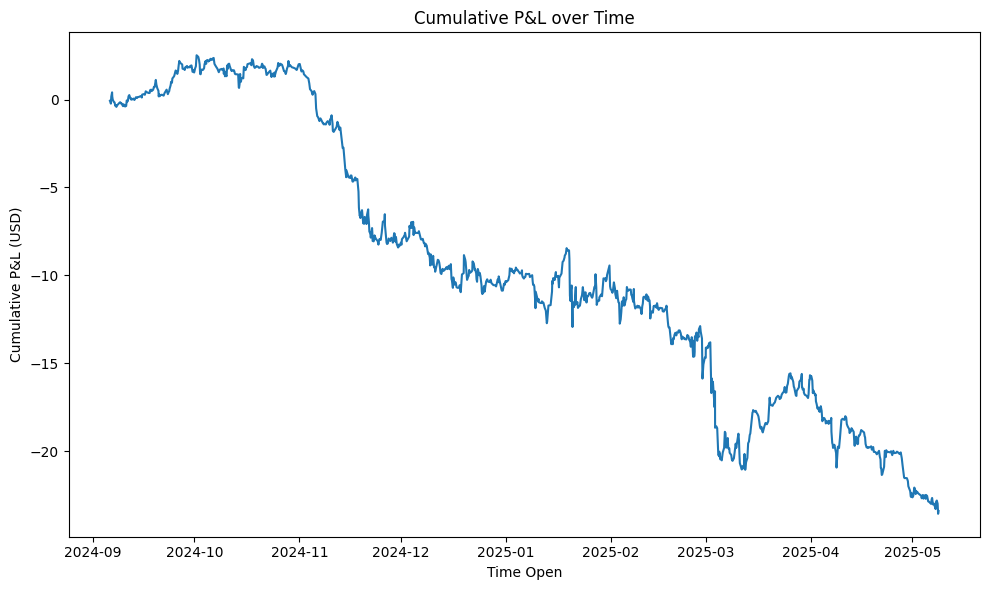

In [191]:
analysis = PortfolioAnalysis(trades)
analysis.stats()
temp = trades.sort_values('time_open')

temp['cum_pl_usd'] = temp['pl_usd'].cumsum()

plt.figure(figsize=(10, 6))
plt.plot(temp['time_open'], temp['cum_pl_usd'])
plt.xlabel('Time Open')
plt.ylabel('Cumulative P&L (USD)')
plt.title('Cumulative P&L over Time')
plt.tight_layout()
plt.show()

In [23]:
def economic_analysis(model_name, min_probability, close_time):
    model1 = load(model_name)
    test = Backtest(model1, btc_df_test, 1000)
    test.predict(min_probability=min_probability)

    test.calculate_trades(target_close=close_time)
    trades = test.trades.copy()
    trades = trades.rename(columns={
        'side':        'side',
        'open_time':   'time_open',
        'open_price':  'price_open',
        'close_time':  'time_close',
        'close_price': 'price_close'
    })
    trades['symbol']           = 'BTC'
    trades['order_weight']     = 1
    trades['is_maker_open']    = False
    trades['is_maker_close']   = True
    trades['amount']           = 0.0005
    trades['volume_usd']       = trades['amount'] * trades['price_open']
    trades['pl_pct']           = (trades.price_close - trades.price_open) / trades.price_open
    # trades['pl_pct'] = np.where(
    #     trades['side'].str.lower() == 'buy',
    #     (trades['price_close'] - trades['price_open']) / trades['price_open'],
    #     (trades['price_open'] - trades['price_close']) / trades['price_open']
    # )
    trades['pl_usd'] = trades['pl_pct'] * trades['volume_usd'] * np.where(
        trades['side'].str.lower() == 'buy', 
        1, 
        -1
    )

    analysis = PortfolioAnalysis(trades)
    analysis.stats()
    temp = trades.sort_values('time_open')

    temp['cum_pl_usd'] = temp['pl_usd'].cumsum()

    plt.figure(figsize=(10, 6))
    plt.plot(temp['time_open'], temp['cum_pl_usd'])
    plt.xlabel('Time Open')
    plt.ylabel('Cumulative P&L %')
    plt.title('Cumulative P&L over Time')
    plt.tight_layout()
    plt.show()
    display(trades)

100%|██████████| 1791/1791 [00:02<00:00, 816.70it/s]


Max profit: 34.635%
Max drawdown: -5.356%
Max daily drawdown: -3.646%
Average deal profit: 0.209%
Average deal loss: -0.203%
Average daily profit: 0.596%
Average daily loss: -0.507%
Deals win rate: 53.936%
Sharpe ratio: 0.669
Longest drawdown period: 36 days
Backtest start: 2024-09-06 02:48:00+00:00
Backtest end: 2025-05-08 17:52:00+00:00
Backtest duration: 244 days 15:04:00
Average Deals per day: 7.31
Average Deals per month: 199.0


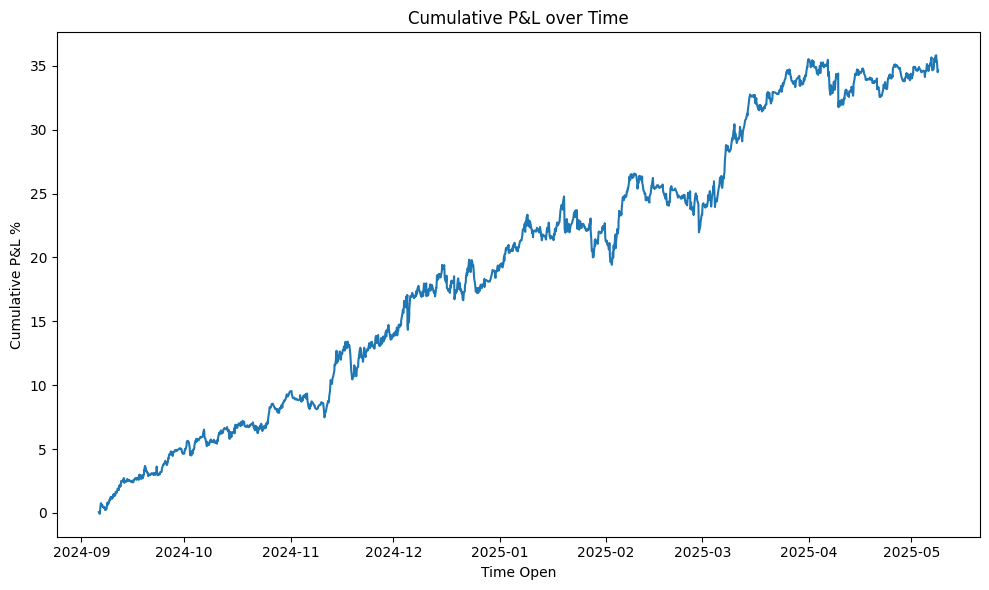

,time_open,price_open,price_close,time_close,side,symbol,order_weight,is_maker_open,is_maker_close,amount,volume_usd,pl_pct,pl_usd
0,2024-09-06 02:48:00+00:00,56798.99,56675.7800,2024-09-06 04:48:00+00:00,sell,BTC,1,False,True,0.0005,28.399495,-0.002169,0.061605
1,2024-09-06 04:00:00+00:00,56588.01,56481.1000,2024-09-06 06:00:00+00:00,buy,BTC,1,False,True,0.0005,28.294005,-0.001889,-0.053455
2,2024-09-06 09:51:00+00:00,55884.00,56046.0000,2024-09-06 11:51:00+00:00,sell,BTC,1,False,True,0.0005,27.942000,0.002899,-0.081000
3,2024-09-06 11:35:00+00:00,55940.01,56499.4101,2024-09-06 12:30:00+00:00,buy,BTC,1,False,True,0.0005,27.970005,0.010000,0.279700
4,2024-09-06 13:31:00+00:00,56858.17,56289.5883,2024-09-06 13:39:00+00:00,sell,BTC,1,False,True,0.0005,28.429085,-0.010000,0.284291
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1786,2025-05-08 05:02:00+00:00,99001.71,99080.0100,2025-05-08 07:02:00+00:00,buy,BTC,1,False,True,0.0005,49.500855,0.000791,0.039150
1787,2025-05-08 06:47:00+00:00,98924.14,99676.6000,2025-05-08 08:47:00+00:00,sell,BTC,1,False,True,0.0005,49.462070,0.007606,-0.376230
1788,2025-05-08 09:46:00+00:00,99600.00,99524.7400,2025-05-08 11:46:00+00:00,buy,BTC,1,False,True,0.0005,49.800000,-0.000756,-0.037630
1789,2025-05-08 14:59:00+00:00,99449.72,101276.4900,2025-05-08 16:59:00+00:00,sell,BTC,1,False,True,0.0005,49.724860,0.018369,-0.913385


In [34]:
economic_analysis(model_name='models/stoh_osc/random_forest/model_test_btc.joblib', min_probability=0.8, close_time=1)

100%|██████████| 1719/1719 [00:02<00:00, 846.75it/s]

Max profit: 29.932%
Max drawdown: -4.263%
Max daily drawdown: -3.793%
Average deal profit: 0.213%
Average deal loss: -0.217%
Average daily profit: 0.597%
Average daily loss: -0.501%
Deals win rate: 54.508%
Sharpe ratio: 0.573
Longest drawdown period: 26 days
Backtest start: 2024-09-06 02:52:00+00:00
Backtest end: 2025-05-08 17:52:00+00:00
Backtest duration: 244 days 15:00:00
Average Deals per day: 7.016
Average Deals per month: 191.0


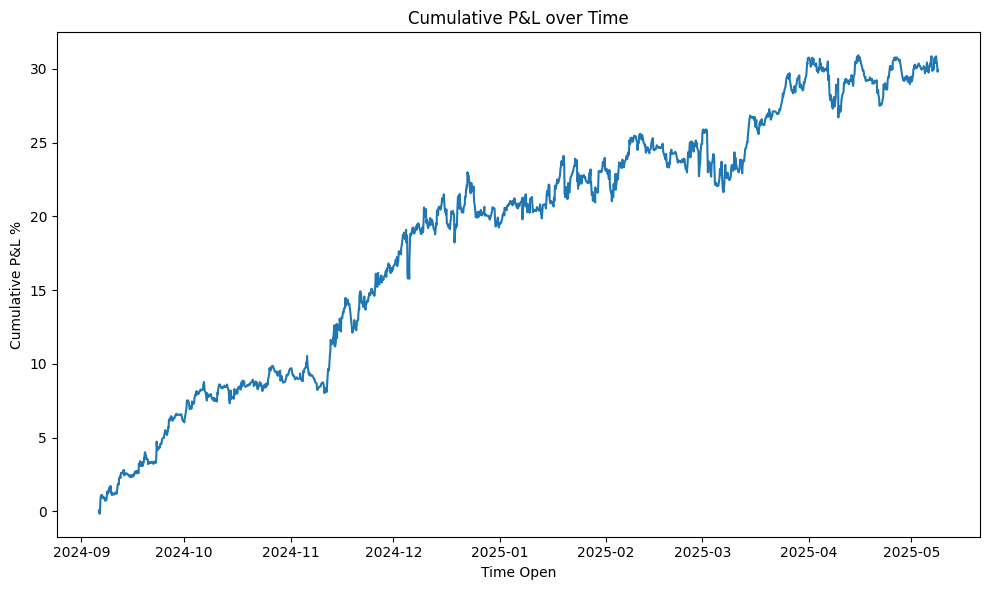

,time_open,price_open,price_close,time_close,side,symbol,order_weight,is_maker_open,is_maker_close,amount,volume_usd,pl_pct,pl_usd
0,2024-09-06 02:52:00+00:00,56732.99,56598.0100,2024-09-06 04:52:00+00:00,sell,BTC,1,False,True,0.0005,28.366495,-0.002379,0.067490
1,2024-09-06 04:00:00+00:00,56588.01,56481.1000,2024-09-06 06:00:00+00:00,buy,BTC,1,False,True,0.0005,28.294005,-0.001889,-0.053455
2,2024-09-06 08:39:00+00:00,55811.52,56161.9900,2024-09-06 10:39:00+00:00,sell,BTC,1,False,True,0.0005,27.905760,0.006280,-0.175235
3,2024-09-06 11:35:00+00:00,55940.01,56629.0100,2024-09-06 13:35:00+00:00,buy,BTC,1,False,True,0.0005,27.970005,0.012317,0.344500
4,2024-09-06 13:31:00+00:00,56858.17,55721.0066,2024-09-06 14:00:00+00:00,sell,BTC,1,False,True,0.0005,28.429085,-0.020000,0.568582
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1714,2025-05-08 05:02:00+00:00,99001.71,99080.0100,2025-05-08 07:02:00+00:00,buy,BTC,1,False,True,0.0005,49.500855,0.000791,0.039150
1715,2025-05-08 06:47:00+00:00,98924.14,99676.6000,2025-05-08 08:47:00+00:00,sell,BTC,1,False,True,0.0005,49.462070,0.007606,-0.376230
1716,2025-05-08 09:47:00+00:00,99619.04,99520.4600,2025-05-08 11:47:00+00:00,buy,BTC,1,False,True,0.0005,49.809520,-0.000990,-0.049290
1717,2025-05-08 14:35:00+00:00,99762.25,100999.9900,2025-05-08 16:35:00+00:00,sell,BTC,1,False,True,0.0005,49.881125,0.012407,-0.618870


In [47]:
economic_analysis(model_name='models/stoh_osc/xgboost/btc_xgb_test.joblib', min_probability=0.8, close_time=2)

100%|██████████| 1921/1921 [00:02<00:00, 844.41it/s]


Max profit: 28.496%
Max drawdown: -7.537%
Max daily drawdown: -6.778%
Average deal profit: 0.226%
Average deal loss: -0.215%
Average daily profit: 0.585%
Average daily loss: -0.478%
Deals win rate: 52.16%
Sharpe ratio: 0.553
Longest drawdown period: 43 days
Backtest start: 2024-09-06 03:38:00+00:00
Backtest end: 2025-05-08 17:45:00+00:00
Backtest duration: 244 days 14:07:00
Average Deals per day: 7.841
Average Deals per month: 213.444


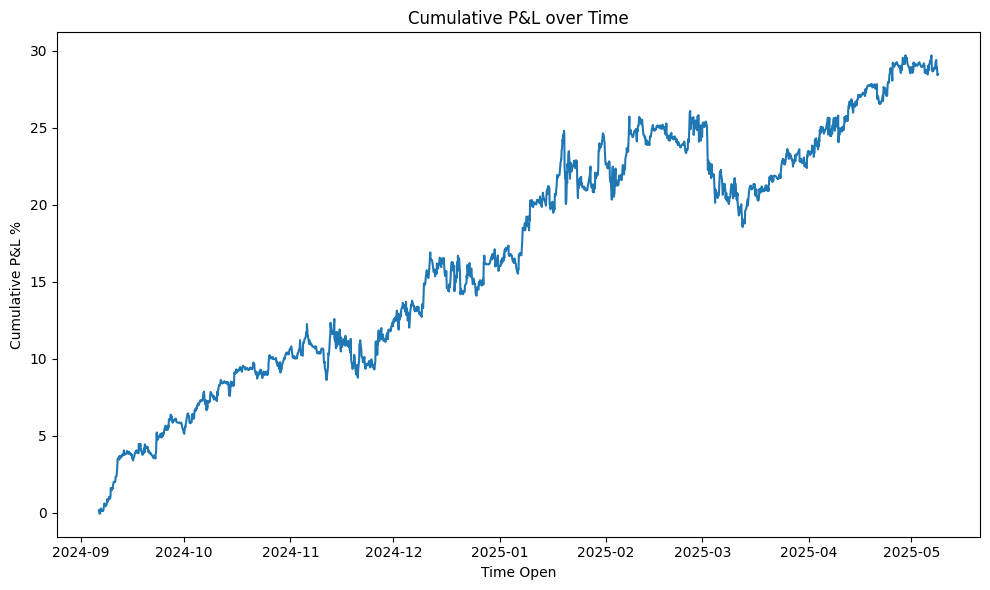

,time_open,price_open,price_close,time_close,side,symbol,order_weight,is_maker_open,is_maker_close,amount,volume_usd,pl_pct,pl_usd
0,2024-09-06 03:38:00+00:00,56767.00,56417.41,2024-09-06 05:38:00+00:00,sell,BTC,1,False,True,0.0005,28.383500,-0.006158,0.174795
1,2024-09-06 03:59:00+00:00,56594.00,56491.01,2024-09-06 05:59:00+00:00,buy,BTC,1,False,True,0.0005,28.297000,-0.001820,-0.051495
2,2024-09-06 08:45:00+00:00,55782.01,56140.82,2024-09-06 10:45:00+00:00,sell,BTC,1,False,True,0.0005,27.891005,0.006432,-0.179405
3,2024-09-06 11:50:00+00:00,55971.09,56001.73,2024-09-06 13:50:00+00:00,buy,BTC,1,False,True,0.0005,27.985545,0.000547,0.015320
4,2024-09-06 17:30:00+00:00,54269.99,53600.00,2024-09-06 19:30:00+00:00,sell,BTC,1,False,True,0.0005,27.134995,-0.012345,0.334995
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1916,2025-05-08 05:00:00+00:00,98954.32,99043.65,2025-05-08 07:00:00+00:00,buy,BTC,1,False,True,0.0005,49.477160,0.000903,0.044665
1917,2025-05-08 06:47:00+00:00,98924.14,99676.60,2025-05-08 08:47:00+00:00,sell,BTC,1,False,True,0.0005,49.462070,0.007606,-0.376230
1918,2025-05-08 09:48:00+00:00,99634.40,99513.76,2025-05-08 11:48:00+00:00,buy,BTC,1,False,True,0.0005,49.817200,-0.001211,-0.060320
1919,2025-05-08 13:38:00+00:00,99562.09,100667.36,2025-05-08 15:38:00+00:00,sell,BTC,1,False,True,0.0005,49.781045,0.011101,-0.552635


In [24]:
economic_analysis(model_name='models/stoh_osc/svc/btc_svc_scaled_test.pkl', min_probability=0.8, close_time=2)